# Coil Optimization using PyTorch and SIMSOPT

This notebook demonstrates how to perform a Stage II coil optimization (finding coils that generate a specific target normal field on a given surface) using PyTorch for the optimization loop, while leveraging SIMSOPT for the physics calculations.

This is based on `simsopt/examples/1_Simple/stage_two_optimization_minimal.py`.

In [9]:
import os
import sys
from pathlib import Path
import numpy as np
import torch
import matplotlib.pyplot as plt

# Add simsopt to path if not installed
#sys.path.append(os.path.abspath('simsopt-master'))

from simsopt.geo import SurfaceRZFourier, create_equally_spaced_curves, \
    CurveLength, curves_to_vtk, RotatedCurve
from simsopt.field import Current, coils_via_symmetries, BiotSavart
from simsopt.objectives import SquaredFlux, QuadraticPenalty

# Check for CUDA
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cpu


In [10]:
# Configuration
ncoils = 4
n_unique_shapes = 4  # Q: number of unique coil shapes (1 <= Q <= ncoils, ncoils must be divisible by Q)
R0 = 1.0
R1 = 0.5
order = 5
LENGTH_WEIGHT = 1.0
LENGTH_TARGET = 18.0
MAXITER = 100

# Paths
TEST_DIR = Path("./../data/test_files").resolve()
filename = TEST_DIR / 'input.LandremanPaul2021_QA'
OUT_DIR = "./output_pytorch_rotated/"
os.makedirs(OUT_DIR, exist_ok=True)

assert 1 <= n_unique_shapes <= ncoils, f"n_unique_shapes={n_unique_shapes} must be between 1 and ncoils={ncoils}"
assert ncoils % n_unique_shapes == 0, (
    f"ncoils={ncoils} must be divisible by n_unique_shapes={n_unique_shapes}"
)

print(f"Reading surface from {filename}")
print(f"Using {n_unique_shapes} unique coil shape(s) across {ncoils} coils per half period")

# Initialize the boundary magnetic surface
nphi = 32
ntheta = 32
s = SurfaceRZFourier.from_vmec_input(filename, range="full torus", nphi=nphi, ntheta=ntheta)

# Create the initial coils
base_curves = create_equally_spaced_curves(ncoils, s.nfp, stellsym=True, R0=R0, R1=R1, order=order)

# Constrain coils to n_unique_shapes unique shapes.
# Coils 0..Q-1 are independent base curves (free DOFs).
# Coil i (for i >= Q) is a RotatedCurve copy of coil (i % Q).
# This creates a repeating pattern, e.g. Q=2, ncoils=4 -> shapes A,B,A,B
delta_angle = (2 * np.pi) / ((1 + int(True)) * s.nfp * ncoils)
for i in range(n_unique_shapes, ncoils):
    template_idx = i % n_unique_shapes
    angle_diff = (i - template_idx) * delta_angle
    base_curves[i] = RotatedCurve(base_curves[template_idx], angle_diff, flip=False)

base_currents = [Current(1.0) * 1e5 for i in range(ncoils)]
base_currents[0].fix_all() # Fix one current to avoid trivial 0 solution

coils = coils_via_symmetries(base_curves, base_currents, s.nfp, True)
bs = BiotSavart(coils)
bs.set_points(s.gamma().reshape((-1, 3)))

# Save initial state
curves = [c.curve for c in coils]
curves_to_vtk(curves, OUT_DIR + "curves_init", close=True)
pointData = {"B_N": np.sum(bs.B().reshape((nphi, ntheta, 3)) * s.unitnormal(), axis=2)[:, :, None]}
s.to_vtk(OUT_DIR + "surf_init", extra_data=pointData)

print("Initial setup complete.")

Reading surface from /Users/stuartsynakowski/Github/COIL_OPT/COIL_OPT/data/test_files/input.LandremanPaul2021_QA
Using 4 unique coil shape(s) across 4 coils per half period
Initial setup complete.


In [11]:
# Define the objective function
Jf = SquaredFlux(s, bs)
Jls = [CurveLength(c) for c in base_curves]

# Total objective: length penalty is on the sum of ALL base curve lengths.
# With Q unique shapes, the rotated copies have the same length as their template,
# so this is equivalent to (ncoils/Q) * sum_of_Q_unique_lengths.
JF = Jf + LENGTH_WEIGHT * QuadraticPenalty(sum(Jls), LENGTH_TARGET, "max")

B_dot_n = np.sum(bs.B().reshape((nphi, ntheta, 3)) * s.unitnormal(), axis=2)
print('Initial max|B dot n|:', np.max(np.abs(B_dot_n)))
print(f'Number of DOFs: {len(JF.x)} ({n_unique_shapes} unique shape(s), {ncoils} total coils per half period)')

Initial max|B dot n|: 0.22999990509425575
Number of DOFs: 135 (4 unique shape(s), 4 total coils per half period)


In [12]:
class SimsoptObjective(torch.autograd.Function):
    @staticmethod
    def forward(ctx, dofs, objective_obj):
        # Convert PyTorch tensor to NumPy array
        dofs_np = dofs.detach().cpu().numpy()
        
        # Update the SIMSOPT objective with the new DOFs
        objective_obj.x = dofs_np
        
        # Calculate the objective value
        loss_val = objective_obj.J()
        
        # Store the objective object for the backward pass
        ctx.objective_obj = objective_obj
        
        # Return the loss as a PyTorch tensor
        return torch.tensor(loss_val, dtype=dofs.dtype, device=dofs.device)

    @staticmethod
    def backward(ctx, grad_output):
        objective_obj = ctx.objective_obj
        
        # Calculate the gradient using SIMSOPT
        # The DOFs are already set in the forward pass
        grad_np = objective_obj.dJ()
        
        # Convert the gradient to a PyTorch tensor
        grad = torch.from_numpy(grad_np).to(grad_output.device).type(grad_output.dtype)
        
        # Return the gradient scaled by grad_output, and None for the objective_obj argument
        return grad * grad_output, None

# Helper function to use the custom autograd function
def simsopt_loss(dofs, objective_obj):
    return SimsoptObjective.apply(dofs, objective_obj)

In [13]:
# Initialize DOFs as a PyTorch tensor
# SIMSOPT uses float64, so we should use DoubleTensor
dofs_init = JF.x
dofs_tensor = torch.tensor(dofs_init, dtype=torch.float64, device=device, requires_grad=True)

# Define the optimizer
# LBFGS is often a good choice for these types of physics optimization problems
optimizer = torch.optim.LBFGS([dofs_tensor], 
                              lr=.10, 
                              max_iter=MAXITER, 
                              max_eval=MAXITER*2, 
                              tolerance_grad=1e-9, 
                              tolerance_change=1e-9, 
                              history_size=100, 
                              line_search_fn="strong_wolfe")

print("Starting optimization...")
loss_history = []

def closure():
    optimizer.zero_grad()
    loss = simsopt_loss(dofs_tensor, JF)
    loss.backward()
    loss_val = loss.item()
    loss_history.append(loss_val)
    if len(loss_history) % 10 == 0:
        print(f"Iter {len(loss_history)}, Loss: {loss_val:.6e}")
    return loss

# Run the optimization
optimizer.step(closure)

print("Optimization complete.")
print(f"Final Loss: {loss_history[-1]}")

Starting optimization...
Iter 10, Loss: 1.251338e-03
Iter 20, Loss: 6.382012e-05
Iter 30, Loss: 1.866102e-05
Iter 40, Loss: 5.082851e-06
Iter 50, Loss: 2.345720e-06
Iter 60, Loss: 1.092464e-06
Iter 70, Loss: 5.788252e-07
Iter 80, Loss: 3.681152e-07
Iter 90, Loss: 2.863714e-07
Iter 100, Loss: 2.854186e-07
Iter 110, Loss: 2.853998e-07
Optimization complete.
Final Loss: 2.8538365082358224e-07


Final max|B dot n|: 0.0008862263495567416
Sum of lengths of base curves: 18.00000011105331
Target length: 18.0


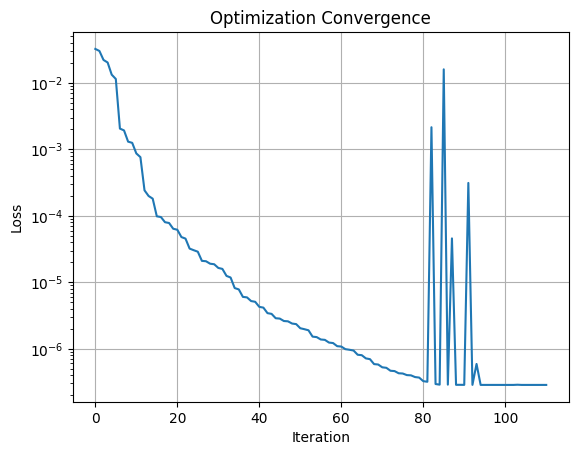

In [14]:
# Ensure the objective is updated with the final parameters
JF.x = dofs_tensor.detach().cpu().numpy()

# Save results
curves_to_vtk(curves, OUT_DIR + "curves_opt", close=True)
pointData = {"B_N": np.sum(bs.B().reshape((nphi, ntheta, 3)) * s.unitnormal(), axis=2)[:, :, None]}
s.to_vtk(OUT_DIR + "surf_opt", extra_data=pointData)

# Print final metrics
B_dot_n = np.sum(bs.B().reshape((nphi, ntheta, 3)) * s.unitnormal(), axis=2)


print('Final max|B dot n|:', np.max(np.abs(B_dot_n)))

total_curve_length = sum(func.J() for func in Jls)
print("Sum of lengths of base curves:", total_curve_length)
print(f"Target length: {LENGTH_TARGET}")

# Save the optimized coil shapes and currents
bs.save(OUT_DIR + "biot_savart_opt.json")

# Plot loss history
plt.figure()
plt.semilogy(loss_history)
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.title("Optimization Convergence")
plt.grid(True)
plt.show()

## Recording the Optimization

We will reset the optimization and record the history of coil shapes to create an animation.

In [15]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import numpy as np

def record_optimization_rotated(optimizer, dofs_tensor, objective, curves):
    """
    Runs the PyTorch LBFGS optimization and records the shapes of all curves at each evaluation.
    """
    history = []
    loss_history = []
    
    def closure():
        optimizer.zero_grad()
        loss = simsopt_loss(dofs_tensor, objective)
        loss.backward()
        
        # Record shapes
        # The curves are updated inside simsopt_loss -> SimsoptObjective.forward
        current_shapes = [c.gamma().copy() for c in curves]
        history.append(current_shapes)
        
        loss_val = loss.item()
        loss_history.append(loss_val)
        
        if len(loss_history) % 10 == 0:
            print(f"Recorded step {len(loss_history)}, Loss: {loss_val:.6e}")
            
        return loss

    print("Starting optimization recording...")
    # LBFGS step performs the entire optimization loop (or up to max_iter)
    optimizer.step(closure)
    print("Recording finished.")
    return history

def save_animation_rotated(history, filename='coil_opt_rotated.gif', fps=10):
    """
    Creates and saves a 3D animation of multiple coils.
    """
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')
    
    # Determine bounds from all frames and all curves
    # history is list of frames. frame is list of curves. curve is (N, 3) array.
    # Let's sample the first and last frame to save time, or just the first if they don't move too much out of bounds
    # Or better, compute global min/max
    
    print("Processing frames for animation bounds...")
    all_points_list = []
    for frame in history:
        for curve in frame:
            all_points_list.append(curve)
    all_points = np.vstack(all_points_list)
    
    min_vals = np.min(all_points, axis=0)
    max_vals = np.max(all_points, axis=0)
    
    n_curves = len(history[0])
    # Create a line object for each curve
    lines = [ax.plot([], [], [], lw=2)[0] for _ in range(n_curves)]
    
    def init():
        ax.set_xlim(min_vals[0], max_vals[0])
        ax.set_ylim(min_vals[1], max_vals[1])
        ax.set_zlim(min_vals[2], max_vals[2])
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        ax.set_title('Rotated Coil Optimization')
        return lines

    def update(frame_idx):
        frame_data = history[frame_idx]
        for i, gamma in enumerate(frame_data):
            # Close the loop
            gamma_plot = np.vstack((gamma, gamma[0]))
            lines[i].set_data(gamma_plot[:, 0], gamma_plot[:, 1])
            lines[i].set_3d_properties(gamma_plot[:, 2])
        return lines

    print(f"Creating animation with {len(history)} frames...")
    anim = FuncAnimation(fig, update, frames=len(history), init_func=init, blit=False)
    
    try:
        anim.save(filename, writer='pillow', fps=fps)
        print(f"Animation saved to {filename}")
    except Exception as e:
        print(f"Could not save animation: {e}")
    
    plt.close(fig)
    return anim

In [16]:
# Reset DOFs to initial state
dofs_tensor.data = torch.tensor(dofs_init, dtype=torch.float64, device=device)

# Re-initialize optimizer to clear state
optimizer = torch.optim.LBFGS([dofs_tensor], 
                              lr=1, 
                              max_iter=MAXITER, 
                              max_eval=MAXITER*2, 
                              tolerance_grad=1e-9, 
                              tolerance_change=1e-9, 
                              history_size=100, 
                              line_search_fn="strong_wolfe")

# Run recording
# Note: 'curves' variable contains all the coils (including symmetries)
history = record_optimization_rotated(optimizer, dofs_tensor, JF, curves)

# Save animation
# This might take a while depending on the number of frames and coils
anim = save_animation_rotated(history, filename='rotated_coil_optimization.gif', fps=15)

# Display
HTML(anim.to_jshtml())

Starting optimization recording...
Recorded step 10, Loss: 6.118980e-05
Recorded step 20, Loss: 6.297974e-06
Recorded step 30, Loss: 1.684951e-06
Recorded step 40, Loss: 5.645571e-07
Recorded step 50, Loss: 3.085326e-07
Recorded step 60, Loss: 3.016016e-07
Recorded step 70, Loss: 3.015541e-07
Recorded step 80, Loss: 2.267753e-07
Recorded step 90, Loss: 1.966469e-07
Recording finished.
Processing frames for animation bounds...
Creating animation with 99 frames...
Animation saved to rotated_coil_optimization.gif
